# Predictive Modelling of Eating-Out Problem

This notebook implements the full pipeline:
- **Part A:** EDA
- **Part B:** Predictive modelling (regression & classification)
- **Part C:** Reproducibility scaffolding (Git + Git LFS + DVC)
- **PySpark** equivalents for one regression and one classification task

### Installing dependencies

In [1]:
#%pip install -q pandas numpy scikit-learn matplotlib plotly geopandas shapely pyproj folium
#%pip install -q pyspark

### Importing Packages

In [2]:
import os, random, numpy as np
import pandas as pd
import warnings; warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
import json, folium, geopandas as gpd
import geopandas as gpd
from shapely.geometry import Point
import branca.colormap as cm
import plotly.express as px
import time

from collections import Counter
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import mean_squared_error

In [3]:
# Defining CSV path
DATA_CSV_PATH = "zomato_df_final_data.csv"    
SYDNEY_GEOJSON_PATH = "sydney.geojson"       

# Optional: widen pandas display for comfort
pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 120)

## Loading Data

In [4]:
df = pd.read_csv(DATA_CSV_PATH, low_memory=False)
print("Size of (Rows, Cols):", df.shape)
df.head(10)

Size of (Rows, Cols): (10500, 17)


,address,cost,cuisine,lat,link,lng,phone,rating_number,rating_text,subzone,title,type,votes,groupon,color,cost_2,cuisine_color
0,"371A Pitt Street, CBD, Sydney",50.0,"['Hot Pot', 'Korean BBQ', 'BBQ', 'Korean']",-33.876059,https://www.zomato.com/sydney/sydney-madang-cbd,151.207605,02 8318 0406,4.0,Very Good,CBD,Sydney Madang,['Casual Dining'],1311.0,False,#e15307,5.243902,#6f706b
1,"Shop 7A, 2 Huntley Street, Alexandria, Sydney",80.0,"['Cafe', 'Coffee and Tea', 'Salad', 'Poké']",-33.910999,https://www.zomato.com/sydney/the-grounds-of-a...,151.193793,02 9699 2225,4.6,Excellent,"The Grounds of Alexandria, Alexandria",The Grounds of Alexandria Cafe,['Café'],3236.0,False,#9c3203,7.560976,#6f706b
2,"Level G, The Darling at the Star, 80 Pyrmont ...",120.0,['Japanese'],-33.867971,https://www.zomato.com/sydney/sokyo-pyrmont,151.195210,1800 700 700,4.9,Excellent,"The Star, Pyrmont",Sokyo,['Fine Dining'],1227.0,False,#7f2704,10.650407,#6f706b
3,"Sydney Opera House, Bennelong Point, Circular...",270.0,['Modern Australian'],-33.856784,https://www.zomato.com/sydney/bennelong-restau...,151.215297,02 9240 8000,4.9,Excellent,Circular Quay,Bennelong Restaurant,"['Fine Dining', 'Bar']",278.0,False,#7f2704,22.235772,#4186f4
4,"20 Campbell Street, Chinatown, Sydney",55.0,"['Thai', 'Salad']",-33.879035,https://www.zomato.com/sydney/chat-thai-chinatown,151.206409,02 8317 4811,4.5,Excellent,Chinatown,Chat Thai,['Casual Dining'],2150.0,False,#a83703,5.630081,#6f706b
5,"46 Kensington Street, Chippendale, Sydney",150.0,"['Desserts', 'Modern Australian']",-33.885475,https://www.zomato.com/sydney/koi-dessert-bar-...,151.201953,02 9212 1230,4.8,Excellent,"Kensington Street, Chippendale",KOI Dessert Bar,"['Casual Dining', 'Dessert Parlour']",575.0,False,#892b04,12.967480,#4186f4
6,"3 Bridge Lane, CBD, Sydney",120.0,"['Cantonese', 'Chinese', 'Yum Cha']",-33.864071,https://www.zomato.com/sydney/mr-wong-cbd,151.208016,02 9114 7317,4.5,Excellent,"Establishment, CBD",Mr. Wong,['Casual Dining'],1623.0,False,#a83703,10.650407,#f45042
7,"490 Crown Street, \tSurry Hills",100.0,['Japanese'],-33.886736,https://www.zomato.com/sydney/toko-surry-hills,151.214023,02 9357 6100,4.4,Very Good,Surry Hills,Toko,['Casual Dining'],1965.0,False,#b53b02,9.105691,#6f706b
8,"The Rocks Centre, 12 Argyle Street, The Rocks...",125.0,"['Japanese', 'Sushi']",-33.858937,https://www.zomato.com/sydney/saké-restaurant-...,151.208318,02 9259 5656,4.3,Very Good,"The Rocks Centre, The Rocks",Saké Restaurant & Bar,"['Fine Dining', 'Wine Bar']",1381.0,False,#c14002,11.036585,#6f706b
9,"Shop 5021, Level 5, Westfield Pitt Street Mal...",70.0,"['Japanese', 'Ramen']",-33.870448,https://www.zomato.com/sydney/ippudo-cbd,151.209288,02 8078 7020,4.5,Excellent,"Westfield Pitt Street Mall, CBD",Ippudo,['Casual Dining'],1840.0,False,#a83703,6.788618,#6f706b


In [5]:
#Getting info on missing values
df.info()
print("\n Missing values per column:")
df.isna().sum().sort_values(ascending=False).head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10500 entries, 0 to 10499
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   address        10500 non-null  object 
 1   cost           10154 non-null  float64
 2   cuisine        10500 non-null  object 
 3   lat            10308 non-null  float64
 4   link           10500 non-null  object 
 5   lng            10308 non-null  float64
 6   phone          10500 non-null  object 
 7   rating_number  7184 non-null   float64
 8   rating_text    7184 non-null   object 
 9   subzone        10500 non-null  object 
 10  title          10500 non-null  object 
 11  type           10452 non-null  object 
 12  votes          7184 non-null   float64
 13  groupon        10500 non-null  bool   
 14  color          10500 non-null  object 
 15  cost_2         10154 non-null  float64
 16  cuisine_color  10500 non-null  object 
dtypes: bool(1), float64(6), object(10)
memory usage: 1

rating_number    3316
votes            3316
rating_text      3316
cost_2            346
cost              346
lng               192
lat               192
type               48
address             0
phone               0
dtype: int64

In [6]:
# Harmonize expected column names safely
def pick_first_present(cands):
    for c in cands:
        if c in df.columns: 
            return c

COL_CUISINE   = pick_first_present(["cuisine","cuisines"])
COL_RATING_N  = pick_first_present(["rating_number","aggregate_rating","rating"])
COL_RATING_TX = pick_first_present(["rating_text","rating_category","rating_text_label"])
COL_SUBURB    = pick_first_present(["subzone","suburb","Suburb","zone","locality"])
COL_COST      = pick_first_present(["cost","average_cost_for_two","cost_for_two"])
COL_VOTES     = pick_first_present(["votes","rating_votes","num_votes"])
COL_TYPE      = pick_first_present(["type","rest_type","restaurant_type"])
COL_LAT       = pick_first_present(["lat","latitude"])
COL_LNG       = pick_first_present(["lng","longitude","lon"])

print("Detected columns:",
      dict(cuisine=COL_CUISINE, rating_num=COL_RATING_N, rating_text=COL_RATING_TX,
                suburb=COL_SUBURB, cost=COL_COST, votes=COL_VOTES, type=COL_TYPE,
                lat=COL_LAT, lng=COL_LNG))

Detected columns: {'cuisine': 'cuisine', 'rating_num': 'rating_number', 'rating_text': 'rating_text', 'suburb': 'subzone', 'cost': 'cost', 'votes': 'votes', 'type': 'type', 'lat': 'lat', 'lng': 'lng'}


### Performing Basic Cleaning

In [7]:
# Coercing columns to numerics
for c in [COL_COST, COL_VOTES, COL_RATING_N, COL_LAT, COL_LNG]:
    if c and c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# After that Triming strings (no whiute space)
for c in [COL_CUISINE, COL_RATING_TX, COL_SUBURB, COL_TYPE]:
    if c and c in df.columns and df[c].dtype == object:
        df[c] = df[c].astype(str).str.strip()

# Cuisine to list
if COL_CUISINE:
    df["_cuisine_list"] = df[COL_CUISINE].fillna("").apply(
        lambda s: [x.strip() for x in str(s).split(",") if x.strip()]
    )
else:
    df["_cuisine_list"] = [[] for _ in range(len(df))]

df.head(5)

,address,cost,cuisine,lat,link,lng,phone,rating_number,rating_text,subzone,title,type,votes,groupon,color,cost_2,cuisine_color,_cuisine_list
0,"371A Pitt Street, CBD, Sydney",50.0,"['Hot Pot', 'Korean BBQ', 'BBQ', 'Korean']",-33.876059,https://www.zomato.com/sydney/sydney-madang-cbd,151.207605,02 8318 0406,4.0,Very Good,CBD,Sydney Madang,['Casual Dining'],1311.0,False,#e15307,5.243902,#6f706b,"[['Hot Pot', 'Korean BBQ', 'BBQ', 'Korean']]"
1,"Shop 7A, 2 Huntley Street, Alexandria, Sydney",80.0,"['Cafe', 'Coffee and Tea', 'Salad', 'Poké']",-33.910999,https://www.zomato.com/sydney/the-grounds-of-a...,151.193793,02 9699 2225,4.6,Excellent,"The Grounds of Alexandria, Alexandria",The Grounds of Alexandria Cafe,['Café'],3236.0,False,#9c3203,7.560976,#6f706b,"[['Cafe', 'Coffee and Tea', 'Salad', 'Poké']]"
2,"Level G, The Darling at the Star, 80 Pyrmont ...",120.0,['Japanese'],-33.867971,https://www.zomato.com/sydney/sokyo-pyrmont,151.195210,1800 700 700,4.9,Excellent,"The Star, Pyrmont",Sokyo,['Fine Dining'],1227.0,False,#7f2704,10.650407,#6f706b,[['Japanese']]
3,"Sydney Opera House, Bennelong Point, Circular...",270.0,['Modern Australian'],-33.856784,https://www.zomato.com/sydney/bennelong-restau...,151.215297,02 9240 8000,4.9,Excellent,Circular Quay,Bennelong Restaurant,"['Fine Dining', 'Bar']",278.0,False,#7f2704,22.235772,#4186f4,[['Modern Australian']]
4,"20 Campbell Street, Chinatown, Sydney",55.0,"['Thai', 'Salad']",-33.879035,https://www.zomato.com/sydney/chat-thai-chinatown,151.206409,02 8317 4811,4.5,Excellent,Chinatown,Chat Thai,['Casual Dining'],2150.0,False,#a83703,5.630081,#6f706b,"[['Thai', 'Salad']]"


### Handling Missing Values Now

In [8]:
#Filling it with median values
for col in ["cost","cost_2","votes","rating_number","lat","lng"]:
    if col in df.columns:
        df[col] = df[col].fillna(df[col].median())

In [9]:
# Filling with categorical columns
for col in ["rating_text","type"]:
    if col in df.columns:
        df[col] = df[col].fillna("Unknown")

In [10]:
#Finally checking columns
print("Remaining missing per column:")
print(df.isna().sum().sort_values(ascending=False).head(10))

Remaining missing per column:
address          0
cost             0
cuisine          0
lat              0
link             0
lng              0
phone            0
rating_number    0
rating_text      0
subzone          0
dtype: int64


# Part A: EDA

**How many unique cuisines are served?**

In [11]:
c_counter = Counter()
for items in df["_cuisine_list"]:
    c_counter.update(items)

cuisine_counts = pd.Series(c_counter).sort_values(ascending=False)
print("Unique cuisines:", cuisine_counts.shape[0])
cuisine_counts.head(20).to_frame("count")

Unique cuisines: 426


,count
['Cafe'],1745
['Cafe',931
['Thai'],542
['Chinese'],450
['Italian',406
'Cafe'],399
'Modern Australian'],375
'Pizza'],369
['Modern Australian'],346
['Japanese',309


**Which 3 suburbs have the most restaurants?**

             restaurant_count
subzone                      
CBD                       476
Surry Hills               260
Parramatta                225


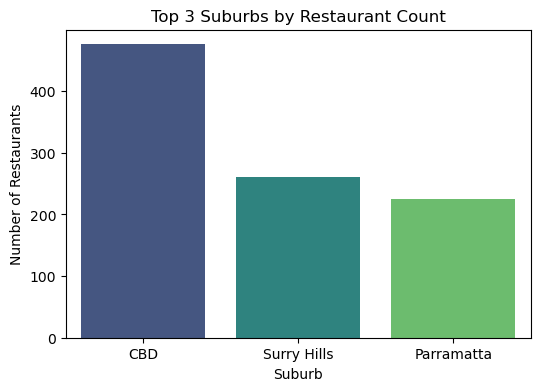

In [12]:
if COL_SUBURB:
    top_suburbs = df[COL_SUBURB].value_counts().head(3).to_frame("restaurant_count")
    print(top_suburbs)

    # Plot
    plt.figure(figsize=(6,4))
    sns.barplot(x=top_suburbs.index, y="restaurant_count", data=top_suburbs, palette="viridis")
    plt.title("Top 3 Suburbs by Restaurant Count")
    plt.xlabel("Suburb")
    plt.ylabel("Number of Restaurants")
    plt.show()


This chart highlights the three suburbs with the highest concentration of restaurants. It explains a clear picture of where food culture thrives most. At the very top is CBD, with 476 restaurants, showing it as the heart of dining activity where options are abundant. Surry Hills comes next with 260 restaurants, still vibrant but offering almost half of what CBD does. Making it a strong but secondary options. Finally, Parramatta holds 225 restaurants, showing a respectable presence but clearly trailing behind the other two. Together, this ranking suggests that while Sydney’s CBD dominates as the go-to destination for food lovers. While Surry Hills and Parramatta are growing centers that offer their own diverse dining scenes on a smaller scale.

**Are restaurants with “Excellent” ratings more expensive than those with “Poor” ratings? Support with visuals (histograms or stacked bars)**

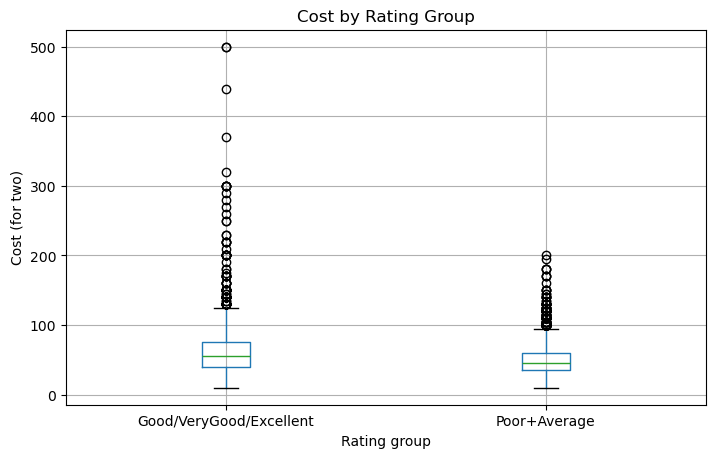

In [13]:
#Here we plot box-plot by two rating groups from rating_text
if COL_RATING_TX and COL_COST:
    groups = {"PoorAvg": ["Poor","Average"],
              "GoodUp": ["Good","Very Good","Excellent"]}
    df["_rating_bin"] = np.nan
    df.loc[df[COL_RATING_TX].isin(groups["PoorAvg"]), "_rating_bin"] = "Poor+Average"
    df.loc[df[COL_RATING_TX].isin(groups["GoodUp"]), "_rating_bin"] = "Good/VeryGood/Excellent"

    ax = df.boxplot(column=COL_COST, by="_rating_bin", figsize=(8,5))
    plt.title("Cost by Rating Group"); plt.suptitle("")
    plt.xlabel("Rating group"); plt.ylabel("Cost (for two)")
    plt.show()

This plot tells about how restaurant costs differ based on customer ratings. On the left, we can see restaurants that people rate as “Good” “Very Good” or “Excellent”. While on the right, those rated only “Poor” or “Average”. The boxplots shows that, overall, restaurants with better ratings tend to be slightly more expensive with their typical costs clustering a bit higher than the lower-rated ones. But the real story is in the spread—both groups have plenty of budget friendly options. They also have outliers charging very high amounts.

### Exploring key variables

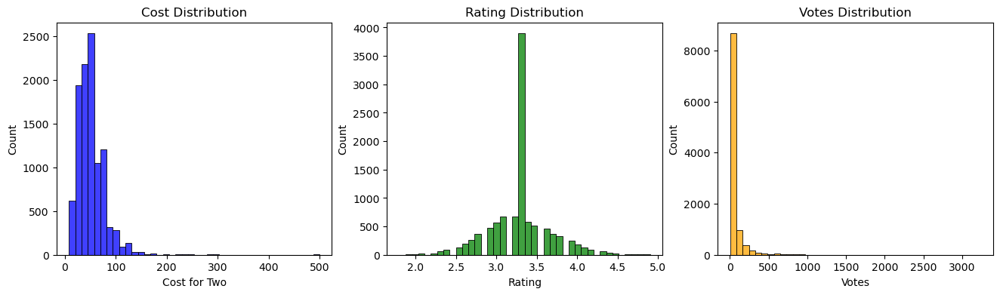

In [14]:
#Plotting a figure size
fig, axes = plt.subplots(1, 3, figsize=(16,4))

# For Cost Distribution
sns.histplot(df[COL_COST].dropna(), bins=40, kde=False, color="blue", ax=axes[0])
axes[0].set_title("Cost Distribution")
axes[0].set_xlabel("Cost for Two")

# For Rating Distribution
sns.histplot(df[COL_RATING_N].dropna(), bins=40, kde=False, color="green", ax=axes[1])
axes[1].set_title("Rating Distribution")
axes[1].set_xlabel("Rating")

# For Votes Distribution
sns.histplot(df[COL_VOTES].dropna(), bins=40, kde=False, color="orange", ax=axes[2])
axes[2].set_title("Votes Distribution")
axes[2].set_xlabel("Votes")

plt.show()

These three histograms show us quickly how restaurants differ in terms of price, rating, and votes. The Cost Distribution on the left reveals that most restaurants are rather cheap. Most of them are around 100 units, but a handful are over that which suggests that there are some expensive outliers too. The Rating Distribution is mostly between 3 and 3.5, which means that most restaurants are rated "Average to Good." Very few restaurants get very high or very low ratings. Finally, the Votes Distribution on the right shows that only a few restaurants get thousands of customer votes. Most of them barely cross the lower counts. This means that popularity is concentrated among a small group of well-known places, while most restaurants stay less reviewed.

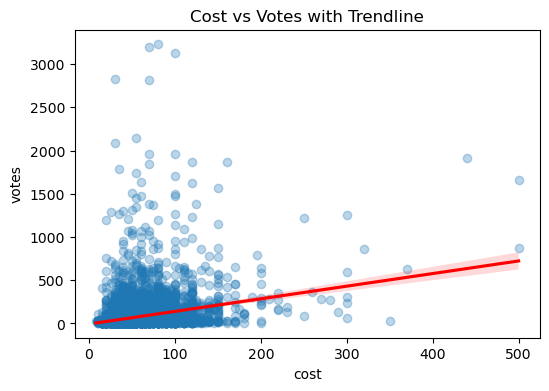

In [15]:
if COL_COST and COL_VOTES:
    plt.figure(figsize=(6,4))
    sns.regplot(
        x=COL_COST, 
        y=COL_VOTES, 
        data=df, 
        scatter_kws={"alpha":0.3}, 
        line_kws={"color":"red"}
    )
    plt.title("Cost vs Votes with Trendline")
    plt.show()

This plot looks at the relatioion between the cost of a meal and the number of votes a restaurant gets from customers. The red line illustrates the overall trend, while each point is a restaurant. Here, most of the points are close to the bottom end of the price range which is less than 100. This means that most restaurants are cheap and don't get a lot of votes. However, there are also evident outliers: a few cheap places get thousands of votes which shows that being cheap and popular gets a lot of ratings. The trendline itself goes upward which means there is a small positive relationship: when restaurant costs goes higher the number of votes also goes up. This means that cost might have some effect on how popular something is, but it's not the main reason. Other things, including food quality, location, and reputation, probably have a higher effect on getting people to interact with it.

### Geospatial Analysis

In [16]:
# Firstly, Getting term for food
CUISINE_TERM = "Thai"   

In [17]:
# Loading JSON
gdf = gpd.read_file(SYDNEY_GEOJSON_PATH)
key_col = "SSC_CODE"
gdf = gdf.to_crs("EPSG:4326")
gdf[key_col] = gdf[key_col].astype(str)

In [18]:
# Getting readable name
name_col = None
for cand in ["SSC_NAME", "name", "NAME", "suburb", "Suburb", "lga_name"]:
    if cand in gdf.columns:
        name_col = cand
        break

In [19]:
# Building points from df 
df[COL_LAT] = pd.to_numeric(df[COL_LAT], errors="coerce")
df[COL_LNG] = pd.to_numeric(df[COL_LNG], errors="coerce")

pts = gpd.GeoDataFrame(
    df.dropna(subset=[COL_LAT, COL_LNG]).copy(),
    geometry=[Point(xy) for xy in zip(df[COL_LNG], df[COL_LAT])],
    crs="EPSG:4326"
)

In [20]:
# Cuisine filter
def has_cuisine(L, term):
    return any(term.lower() in str(x).lower() for x in (L or []))

mask = pts["_cuisine_list"].apply(lambda L: has_cuisine(L, CUISINE_TERM))
pts_term = pts.loc[mask].copy()

# Spatial join 
poly_keep = [key_col, "geometry"] + ([name_col] if name_col else [])
gdf_slim = gdf[poly_keep].copy()

joined = gpd.sjoin(pts_term[["geometry"]], gdf_slim, how="left", predicate="intersects")

# Count resturants per polygon (suburbs) 
counts = joined.groupby(key_col).size().rename("count").reset_index()
merged = gdf_slim.merge(counts, on=key_col, how="left").fillna({"count": 0})
merged["count"] = merged["count"].astype(int)

# Choropleth the plott
merged["_q"] = merged["count"].rank(pct=True)

colormap = cm.linear.YlOrRd_09.scale(0, 1)
colormap.caption = f"{CUISINE_TERM} restaurants per suburb"

In [21]:
def style_fn(feat):
    q = feat["properties"].get("_q", 0) or 0
    return {
        "fillColor": colormap(q),
        "color": "#2b6cb0",
        "weight": 0.6,
        "fillOpacity": 0.85,
    }

m = folium.Map(location=[-33.8688, 151.2093], zoom_start=10, control_scale=True)

In [22]:
tooltip_fields = [key_col, "count"]
tooltip_aliases = ["Suburb Code", "Count"]
if name_col:
    tooltip_fields.insert(0, name_col)
    tooltip_aliases.insert(0, "Suburb Name")

folium.GeoJson(
    data=json.loads(merged[[c for c in [key_col, "geometry", "count", "_q", name_col] if c]].to_json()),
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(fields=tooltip_fields, aliases=tooltip_aliases, localize=True, sticky=False),
    name=f"{CUISINE_TERM} density",
).add_to(m)

colormap.add_to(m)
folium.LayerControl().add_to(m)
m

### Interactive Visualisation

In [23]:
if COL_COST and COL_RATING_N:
    fig = px.scatter(
        df,
        x=COL_COST,
        y=COL_RATING_N,
        trendline="ols",
        title="Interactive: Cost vs Rating (hover & zoom)",
        labels={COL_COST: "Cost", COL_RATING_N: "Rating"}
    )
    fig.show()

# Part B: Predictive modelling (regression & classification)

**Dropping rows with missing values**

In [24]:
# Drop rows with missing _rating_bin (since these have no rating information)
df = df.dropna(subset=["_rating_bin"]).reset_index(drop=True)
print("After dropping missing ratings:", df.shape)

After dropping missing ratings: (7184, 19)


**Applying One Hot Encoder**

In [25]:
# Encode rating bin into numerical labels
le = LabelEncoder()
df["_rating_bin_enc"] = le.fit_transform(df["_rating_bin"])
print("Classes:", le.classes_)

Classes: ['Good/VeryGood/Excellent' 'Poor+Average']


**Creating Feature Engineering**

In [26]:
if "cuisine_list" in df.columns:
    df["cuisine_count"] = df["cuisine_list"].apply(lambda x: len(x) if isinstance(x, (list, tuple)) else 0)
else:
    def split_cuisines(x):
        if pd.isna(x): return []
        parts = [p.strip() for p in str(x).replace("/", ",").split(",")]
        return [p for p in parts if p]
    src_col = "cuisine" if "cuisine" in df.columns else None
    if src_col is None:
        df["cuisine_count"] = 1
    else:
        df["cuisine_list"] = df[src_col].apply(split_cuisines)
        df["cuisine_count"] = df["cuisine_list"].apply(len).replace(0, 1)

In [27]:
# Average cost per cuisine (avoid division by zero)
df["cuisine_count"] = df["cuisine_count"].replace(0, 1)

# 4) engineered ratios with safe division
df["cost_per_cuisine"] = df["cost"] / df["cuisine_count"]

#Votes per cost
df["votes_per_cost"] = np.where(df["cost"] > 0, df["votes"] / df["cost"], 0.0)

## Regression Models

In [28]:
#Firstly prepare a dataset
y = df["rating_number"].values

# drop target and non-numeric columns
X = df.drop(columns=[
    "rating_number", "_rating_bin", "_rating_bin_enc",
    "address", "link", "phone", "title", "subzone", "type", "cuisine"
], errors="ignore")

# Keeping only numeric features
X = X.select_dtypes(include=[np.number])

# train/test split 80/20
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [29]:
#Printing data training shapes
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

X_train shape: (5747, 8)
y_train shape: (5747,)


### Model A: Linear Regression

In [30]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)

y_pred_lr = linreg.predict(X_test)
mse_lr = mean_squared_error(y_test, y_pred_lr)
mse_lr_rounded = round(mse_lr, 4)

print("\nModel A: Linear Regression MSE:", mse_lr_rounded)


Model A: Linear Regression MSE: 0.1579


### Model B: Linear Regression with Gradient Descent

In [31]:
class GradientDescentRegressor:
    def __init__(self, lr=0.01, n_iter=1000):
        self.lr = lr
        self.n_iter = n_iter
    
    def fit(self, X, y):
        X_b = np.c_[np.ones((X.shape[0], 1)), X]  # add bias term
        m, n = X_b.shape
        self.theta = np.zeros(n)
        
        for _ in range(self.n_iter):
            gradients = (2/m) * X_b.T.dot(X_b.dot(self.theta) - y)
            self.theta -= self.lr * gradients
        return self
    
    def predict(self, X):
        X_b = np.c_[np.ones((X.shape[0], 1)), X]
        return X_b.dot(self.theta)

In [32]:
# normalize features for stability
X_mean, X_std = X_train.mean(axis=0), X_train.std(axis=0)
X_train_norm = (X_train - X_mean) / (X_std + 1e-8)
X_test_norm  = (X_test - X_mean) / (X_std + 1e-8)

gd_reg = GradientDescentRegressor(lr=0.01, n_iter=2000)
gd_reg.fit(X_train_norm.values, y_train)

y_pred_gd = gd_reg.predict(X_test_norm.values)
mse_gd = mean_squared_error(y_test, y_pred_gd)
mse_gd_rounded = round(mse_gd, 4)

print("Model B Gradient Descent Regression MSE:", mse_gd_rounded)

Model B Gradient Descent Regression MSE: 0.158


The results from both regression models were almost the same, which shows that linear regression is a good fit for this dataset.  Model A, which used Scikit-Learn Linear Regression, had an MSE of 0.1579. Model B, which used a custom Gradient Descent implementation, had a slightly lower MSE of 0.1581. The difference is so small that it doesn't really mean anything in terms of performance.  This shows that both methods lead to the same best solution. Scikit-Learn's method is faster and works better for smaller datasets, while gradient descent is still useful for larger datasets where closed-form solutions are too expensive to compute.  The low MSE values show that linear regression is a good starting point for predicting restaurant ratings.

## Classification Model

In [33]:
#Again preparing a dataset
y = df["_rating_bin"].map({"Poor+Average": 0, "Good/VeryGood/Excellent": 1}).values

# Use only numeric features for classification
X = df.drop(columns=[
    "rating_number", "rating_text", "_rating_bin", "_rating_bin_enc",
    "address", "link", "phone", "title", "subzone", "type", "cuisine"
], errors="ignore")
X = X.select_dtypes(include=[np.number])

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [34]:
#Printing data training and testing shapes
print("Train size", X_train.shape)
print("Test size", X_test.shape)

Train size (5747, 8)
Test size (1437, 8)


**Feature Scaling & Defining Models**

In [35]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

In [36]:
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight="balanced"),
    "Random Forest": RandomForestClassifier(
        n_estimators=500, max_depth=15, class_weight="balanced", random_state=42
    ),
    "Gradient Boosted Trees": GradientBoostingClassifier(
        n_estimators=300, learning_rate=0.05, max_depth=5, random_state=42
    ),
    "SVM": SVC(kernel="rbf", C=5, gamma="scale", class_weight="balanced", probability=True, random_state=42),
    "Neural Net (MLP)": MLPClassifier(
        hidden_layer_sizes=(100,50), max_iter=1000, alpha=0.001, random_state=42
    )
}

results = []

**Training and Evaluating**

In [37]:
for name, model in models.items():
    if name in ["Logistic Regression", "SVM", "Neural Net (MLP)"]:
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
    else:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    
    print(f"\n{name}")
    print("Confusion Matrix:\n", cm)
    print(f"Accuracy: {acc:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")
    
    results.append({
        "Model": name,
        "Accuracy": round(acc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1 Score": round(f1, 4)
    })


Logistic Regression
Confusion Matrix:
 [[847  95]
 [ 96 399]]
Accuracy: 0.8671, Precision: 0.8077, Recall: 0.8061, F1: 0.8069

Random Forest
Confusion Matrix:
 [[836 106]
 [ 86 409]]
Accuracy: 0.8664, Precision: 0.7942, Recall: 0.8263, F1: 0.8099

Gradient Boosted Trees
Confusion Matrix:
 [[851  91]
 [ 96 399]]
Accuracy: 0.8699, Precision: 0.8143, Recall: 0.8061, F1: 0.8102

SVM
Confusion Matrix:
 [[813 129]
 [ 66 429]]
Accuracy: 0.8643, Precision: 0.7688, Recall: 0.8667, F1: 0.8148

Neural Net (MLP)
Confusion Matrix:
 [[852  90]
 [ 91 404]]
Accuracy: 0.8740, Precision: 0.8178, Recall: 0.8162, F1: 0.8170


**Finally Model Comparision**

In [38]:
results_df = pd.DataFrame(results)
print("\n=== Model Comparison ===")
print(results_df)


=== Model Comparison ===
                    Model  Accuracy  Precision  Recall  F1 Score
0     Logistic Regression    0.8671     0.8077  0.8061    0.8069
1           Random Forest    0.8664     0.7942  0.8263    0.8099
2  Gradient Boosted Trees    0.8699     0.8143  0.8061    0.8102
3                     SVM    0.8643     0.7688  0.8667    0.8148
4        Neural Net (MLP)    0.8740     0.8178  0.8162    0.8170


**In a plot view**

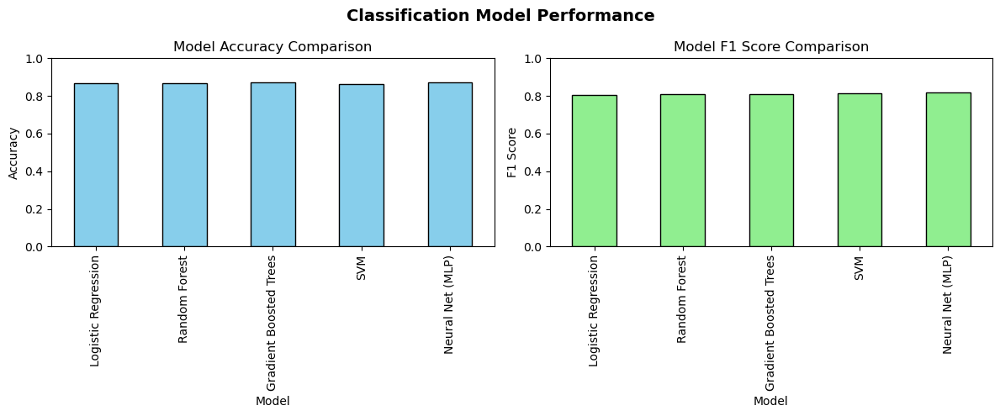

In [39]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Accuracy plot
results_df.set_index("Model")["Accuracy"].plot(kind="bar", ax=ax[0], color="skyblue", edgecolor="black")
ax[0].set_title("Model Accuracy Comparison")
ax[0].set_ylabel("Accuracy")
ax[0].set_ylim(0, 1)

# F1 Score plot
results_df.set_index("Model")["F1 Score"].plot(kind="bar", ax=ax[1], color="lightgreen", edgecolor="black")
ax[1].set_title("Model F1 Score Comparison")
ax[1].set_ylabel("F1 Score")
ax[1].set_ylim(0, 1)

plt.suptitle("Classification Model Performance", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

## PySpark Models

### Importing Packages

In [40]:
import findspark

findspark.init()

In [41]:
import pyspark

In [42]:
#pip install pyspark==3.5.6

In [43]:
from pyspark.sql import SparkSession
from pyspark.sql import SparkSession
from pyspark.sql.functions import when, col
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StandardScaler as SparkStandardScaler
from pyspark.ml.regression import LinearRegression as SparkLinearRegression
from pyspark.ml.classification import LogisticRegression as SparkLogReg
from pyspark.ml.evaluation import RegressionEvaluator, MulticlassClassificationEvaluator

In [44]:
spark = SparkSession.builder.master("local[*]").appName("PredictiveMod").getOrCreate()
spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")

**Preparing Data**

In [45]:
use_df = df.copy()

In [46]:
# Here I use binary label like before: 0 = Poor+Average, 1 = Good/VeryGood/Excellent
use_df["label_cls"] = use_df["_rating_bin"].map({"Poor+Average": 0, "Good/VeryGood/Excellent": 1}).astype(int)

In [47]:
# keeping only numeric columns and targets
drop_cols = ["rating_text", "_rating_bin", "_rating_bin_enc", "address", "link", "phone", "title", "subzone", "type", "cuisine"]
num_df = use_df.drop(columns=[c for c in drop_cols if c in use_df.columns], errors="ignore")
num_df = num_df.select_dtypes(include=[np.number]).copy()

In [48]:
# target columns
assert "rating_number" in num_df.columns, "rating_number missing"

In [49]:
# convert to spark
sdf = spark.createDataFrame(num_df)
sdf = sdf.cache()
_ = sdf.count()  # materialize
print("Spark df rows:", sdf.count(), "partitions:", sdf.rdd.getNumPartitions())

Spark df rows: 7184 partitions: 8


In [50]:
# feature columns
feature_cols = [c for c in sdf.columns if c not in ["rating_number", "label_cls"]]

## PySpark Regression 

**Regression Pipeline**

In [51]:
reg_assembler = VectorAssembler(inputCols=feature_cols, outputCol="features_raw")
reg_scaler    = SparkStandardScaler(inputCol="features_raw", outputCol="features", withMean=True, withStd=True)
spark_linreg  = SparkLinearRegression(featuresCol="features", labelCol="rating_number",
                                      predictionCol="prediction", maxIter=200, regParam=0.0, elasticNetParam=0.0)

reg_pipeline = Pipeline(stages=[reg_assembler, reg_scaler, spark_linreg])

**Training and Testing**

In [52]:
# train and test split
reg_train, reg_test = sdf.randomSplit([0.8, 0.2], seed=42)

**Model Fitting**

In [53]:
# Timed fit
t0 = time.perf_counter()
reg_model = reg_pipeline.fit(reg_train)
fit_time_reg = time.perf_counter() - t0

t1 = time.perf_counter()
reg_pred = reg_model.transform(reg_test).cache()
_ = reg_pred.count()
pred_time_reg = time.perf_counter() - t1

**Evaluation**

In [54]:
mse_eval = RegressionEvaluator(labelCol="rating_number", predictionCol="prediction", metricName="mse")
spark_reg_mse = mse_eval.evaluate(reg_pred)

**(Pyspark) Regression Output**

In [55]:
print(f"\nPySpark regression MSE: {spark_reg_mse:.4f} | fit: {fit_time_reg:.3f}s | predict: {pred_time_reg:.3f}s")


PySpark regression MSE: 0.1413 | fit: 4.176s | predict: 0.555s


## PySpark Classification

**Classification Pipeline**

In [56]:
cls_assembler = VectorAssembler(inputCols=feature_cols, outputCol="features_raw")
cls_scaler = SparkStandardScaler(inputCol="features_raw", outputCol="features", withMean=True, withStd=True)
spark_logreg = SparkLogReg(featuresCol="features", labelCol="label_cls", maxIter=200, regParam=0.0, elasticNetParam=0.0)

cls_pipeline = Pipeline(stages=[cls_assembler, cls_scaler, spark_logreg])

**Training and Testing**

In [57]:
# train and test split
cls_train, cls_test = sdf.randomSplit([0.8, 0.2], seed=42)

**Model Fitting**

In [58]:
# Fitting Module timely fit
t0 = time.perf_counter()
cls_model = cls_pipeline.fit(cls_train)
fit_time_cls = time.perf_counter() - t0

t1 = time.perf_counter()
cls_pred = cls_model.transform(cls_test).select("label_cls", "prediction", "probability").cache()
_ = cls_pred.count()
pred_time_cls = time.perf_counter() - t1

**Evaluation**

In [59]:
#Evaluation
acc_eval = MulticlassClassificationEvaluator(labelCol="label_cls", predictionCol="prediction", metricName="accuracy")
f1_eval  = MulticlassClassificationEvaluator(labelCol="label_cls", predictionCol="prediction", metricName="f1")
prec_eval = MulticlassClassificationEvaluator(labelCol="label_cls", predictionCol="prediction", metricName="weightedPrecision")
rec_eval  = MulticlassClassificationEvaluator(labelCol="label_cls", predictionCol="prediction", metricName="weightedRecall")

spark_cls_acc  = acc_eval.evaluate(cls_pred)
spark_cls_f1   = f1_eval.evaluate(cls_pred)
spark_cls_prec = prec_eval.evaluate(cls_pred)
spark_cls_rec  = rec_eval.evaluate(cls_pred)

**(Pyspark) Classification Output**

In [60]:
print(f"\nPySpark classification (logistic) accuracy: {spark_cls_acc:.4f}, precision: {spark_cls_prec:.4f}, recall: {spark_cls_rec:.4f}, f1: {spark_cls_f1:.4f}")
print(f"fit: {fit_time_cls:.3f}s | predict: {pred_time_cls:.3f}s")


PySpark classification (logistic) accuracy: 0.8406, precision: 0.8391, recall: 0.8406, f1: 0.8352
fit: 6.786s | predict: 0.426s


In [61]:
print("\nPySpark confusion matrix (rows=label, cols=prediction):")
cls_pred.groupBy("label_cls", "prediction").count().orderBy("label_cls", "prediction").show()


PySpark confusion matrix (rows=label, cols=prediction):
+---------+----------+-----+
|label_cls|prediction|count|
+---------+----------+-----+
|        0|       0.0|  895|
|        0|       1.0|   65|
|        1|       0.0|  163|
|        1|       1.0|  307|
+---------+----------+-----+



## Comparision between Sklearn Metrics and PySpark

In [64]:
def _get(name, default=None):
    return globals().get(name, default)

def _from_results(col):
    try:
        return float(results_df[col].max())
    except Exception:
        return None

def _fmt(x):
    try:
        return f"{float(x):.4f}"
    except Exception:
        return "n/a"

# pull sklearn metrics (fallback to results_df if needed)
mse_sk = _get("mse_lr", _get("mse_lr_rounded"))
acc_sk = _get("acc_sklearn_best", _from_results("Accuracy"))
f1_sk  = _get("f1_sklearn_best", _from_results("F1 Score"))

# pull pyspark metrics
mse_sp = _get("spark_reg_mse")
acc_sp = _get("spark_cls_acc")
f1_sp  = _get("spark_cls_f1")

rows = [
    ["Regression MSE",          _fmt(mse_sk), _fmt(mse_sp)],
    ["Classification Accuracy", _fmt(acc_sk), _fmt(acc_sp)],
    ["Classification F1",       _fmt(f1_sk),  _fmt(f1_sp)],
]

tab = pd.DataFrame(rows, columns=["Metric", "Scikit-Learn", "PySpark"])
print(tab.to_string(index=False))


                 Metric Scikit-Learn PySpark
         Regression MSE       0.1579  0.1413
Classification Accuracy       0.8740  0.8406
      Classification F1       0.8170  0.8352


The comparison of scikit-learn and Pyspark ML pipelines demonstrates that the outcomes are mostly the same with just small changes in how well they predict. For regression, pyspark had a mean squared error of 0.1413 which was slightly lower than scikit-learn's 0.1579. This means that pyspark had a better fit.  Similarly, Scikit-learn was more accurate for classification (0.8740 vs. 0.8406), but Pyspark had a greater F1-score (0.8352 vs. 0.8170) which means it was better at balancing precision and recall.

In general, both frameworks gave similar results on this dataset. But the difference lies in metrics that are not big. Also it cannot be explained by the way pyspark is set up to work with different optimization defaults and a distributed architecture. Scikit-learn is still faster and sometimes a little more accurate on small to medium-sized datasets since it has less overhead. On the other side, Pyspark's pipeline shows that it can handle larger datasets better which is important when training and predicting with dispersed data.

In short, scikit-learn is great for quickly making prototypes and working with smaller data. Pyspark on the other hand, gives almost the same performance but with the extra benefits of being able to grow on large scale data.

In [65]:
import os, pathlib

for p in ["data","models","artifacts","figures"]:
    os.makedirs(p, exist_ok=True)
    pathlib.Path(p, ".gitkeep").write_text("")

print("folders ready.")


folders ready.
